# Detecção de objetos zero-shot

Assim como para outras tarefas, temos modelos zero-shot de detecção, que não foram treinados com nenhum label ou classe específico.

Vamos testar o uso do seguinte modelo: https://huggingface.co/google/owlv2-base-patch16-ensemble

In [22]:
from transformers import pipeline

detector = pipeline("zero-shot-object-detection", model="google/owlv2-base-patch16-ensemble")

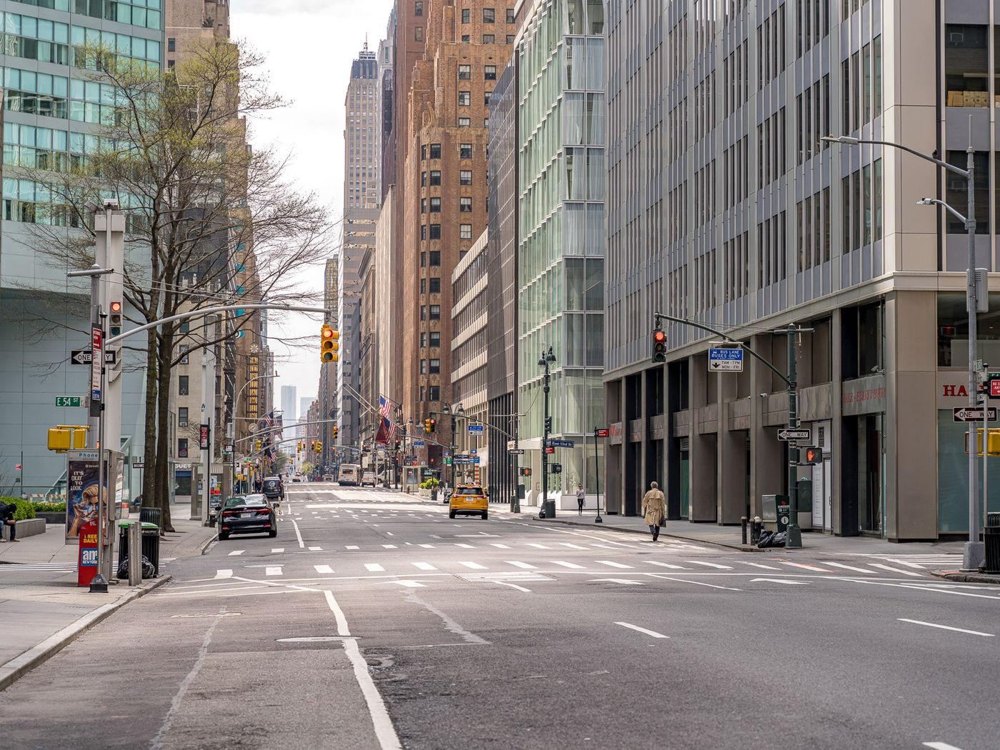

In [23]:
from pathlib import Path
from PIL import Image

imagem = Image.open(Path('imagens/cidades/city.jpg'))
imagem

In [24]:
classes = [
    'tree',
    'person',
    'building',
    'US flag',
    'crosswalk',
]

deteccao = detector(imagem, candidate_labels=classes)
deteccao

[{'score': 0.5501299500465393,
  'label': 'building',
  'box': {'xmin': 809, 'ymin': 3, 'xmax': 1395, 'ymax': 561}},
 {'score': 0.5241608619689941,
  'label': 'US flag',
  'box': {'xmin': 529, 'ymin': 413, 'xmax': 550, 'ymax': 438}},
 {'score': 0.5109062790870667,
  'label': 'building',
  'box': {'xmin': 562, 'ymin': 4, 'xmax': 670, 'ymax': 508}},
 {'score': 0.5102083086967468,
  'label': 'US flag',
  'box': {'xmin': 525, 'ymin': 417, 'xmax': 550, 'ymax': 466}},
 {'score': 0.47076043486595154,
  'label': 'building',
  'box': {'xmin': 223, 'ymin': 3, 'xmax': 359, 'ymax': 511}},
 {'score': 0.4692600965499878,
  'label': 'building',
  'box': {'xmin': 474, 'ymin': 25, 'xmax': 540, 'ymax': 499}},
 {'score': 0.45945408940315247,
  'label': 'building',
  'box': {'xmin': 737, 'ymin': 0, 'xmax': 846, 'ymax': 531}},
 {'score': 0.447567343711853,
  'label': 'building',
  'box': {'xmin': 0, 'ymin': 0, 'xmax': 237, 'ymax': 508}},
 {'score': 0.4115859866142273,
  'label': 'crosswalk',
  'box': {'xmi

Neste caso, o threshold padrão é mais baixo. Mas podemos fazer um filtro manualmente da seguinte forma:

In [25]:
threshold = 0.4

deteccao = [det for det in deteccao if det['score'] >= threshold]

Para visualizar as anotações, podemos usar o mesmo código de antes:

Counter({'building': 6, 'US flag': 3, 'crosswalk': 1})


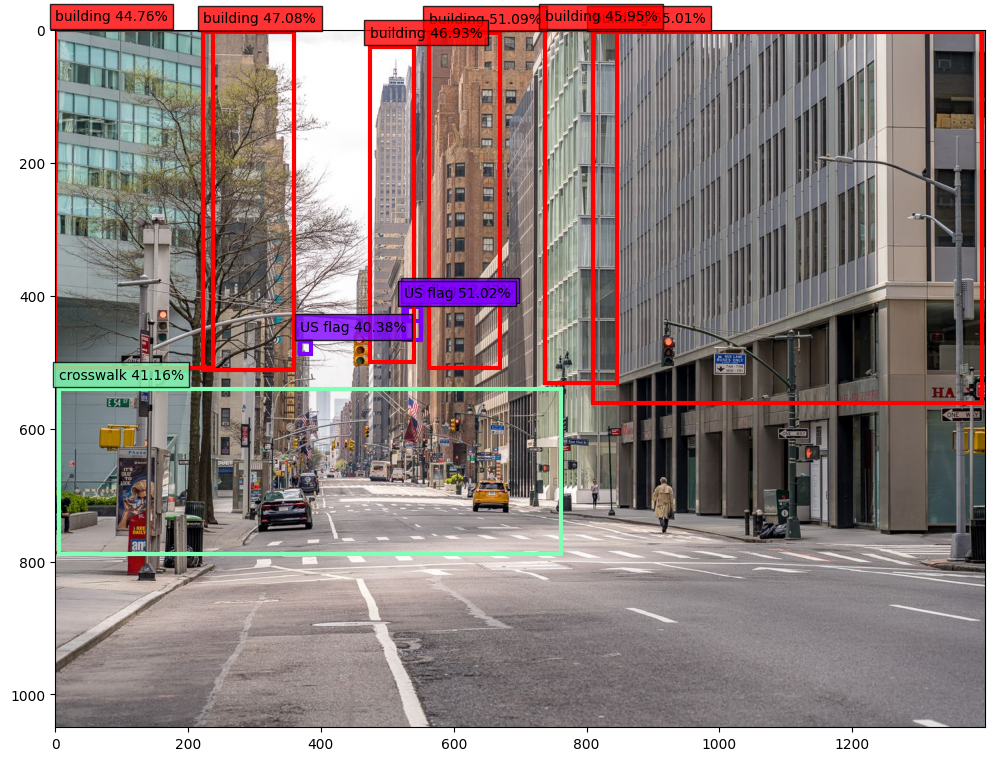

In [26]:
from collections import Counter

import matplotlib.pyplot as plt
from matplotlib import patches
from matplotlib import colormaps
import numpy as np


def plotar_deteccao(imagem, deteccao, colormap='viridis'):
    labels = {det['label'] for det in deteccao}
    indices_cor = np.linspace(0, 1, len(labels))
    cores = [colormaps.get_cmap(colormap)(x) for x in indices_cor]
    cores = dict(zip(labels, cores))
    
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(imagem)
    
    for det in deteccao:
        box = det['box']
        cor = cores[det['label']]
        origem = (box['xmin'], box['ymin'])
        largura = box['xmax'] - box['xmin']
        altura = box['ymax'] - box['ymin']
        
        rect = patches.Rectangle(origem, largura, altura, linewidth=3, edgecolor=cor, facecolor='none')
        ax.add_patch(rect)

        texto = f"{det['label']} {100 * det['score']:.2f}%"
        ax.text(box['xmin'], box['ymin'] - 15, texto, bbox={'facecolor': cor, 'alpha': 0.8})


contador = Counter(det['label'] for det in deteccao)
print(contador)

plotar_deteccao(imagem=imagem, deteccao=deteccao, colormap='rainbow')
plt.show()

Parece que as caixas estão desalinhadas - na verdade, há um bug com a saída do modelo para imagens não quadradas.

Vamos implementar o ajuste sugerido aqui: https://discuss.huggingface.co/t/owl-v2-bounding-box-misalignment-problem/66181/7

In [27]:
def ajustar_caixas(imagem, deteccao):
    width, height = imagem.size
    width_ratio = 1
    height_ratio = 1
    if width > height:
        height_ratio = height / width
    elif height > width:
        width_ratio = width / height
    for det in deteccao:
        det['box']['xmin'] = det['box']['xmin'] / width_ratio
        det['box']['xmax'] = det['box']['xmax'] / width_ratio
        det['box']['ymin'] = det['box']['ymin'] / height_ratio
        det['box']['ymax'] = det['box']['ymax'] / height_ratio

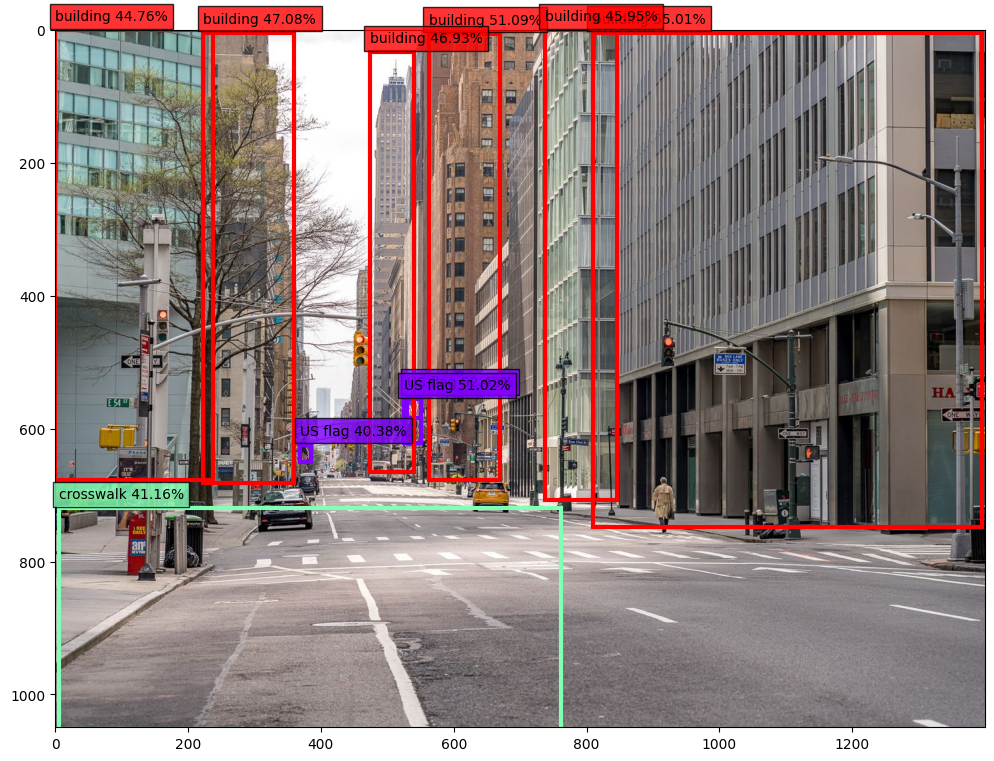

In [28]:
ajustar_caixas(imagem=imagem, deteccao=deteccao)
plotar_deteccao(imagem=imagem, deteccao=deteccao, colormap='rainbow')
plt.show()

## Testando em outras imagens

Counter({'painting': 12, 'chair': 2, 'tree': 1})


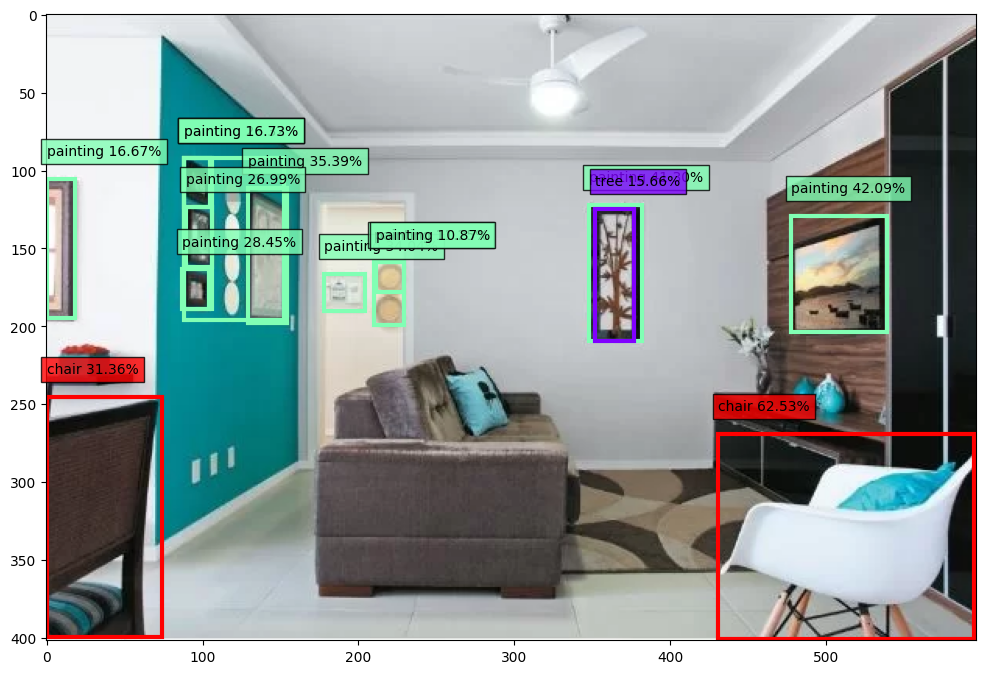

Counter({'house': 4, 'painting': 2, 'building': 2, 'chair': 1, 'tree': 1})


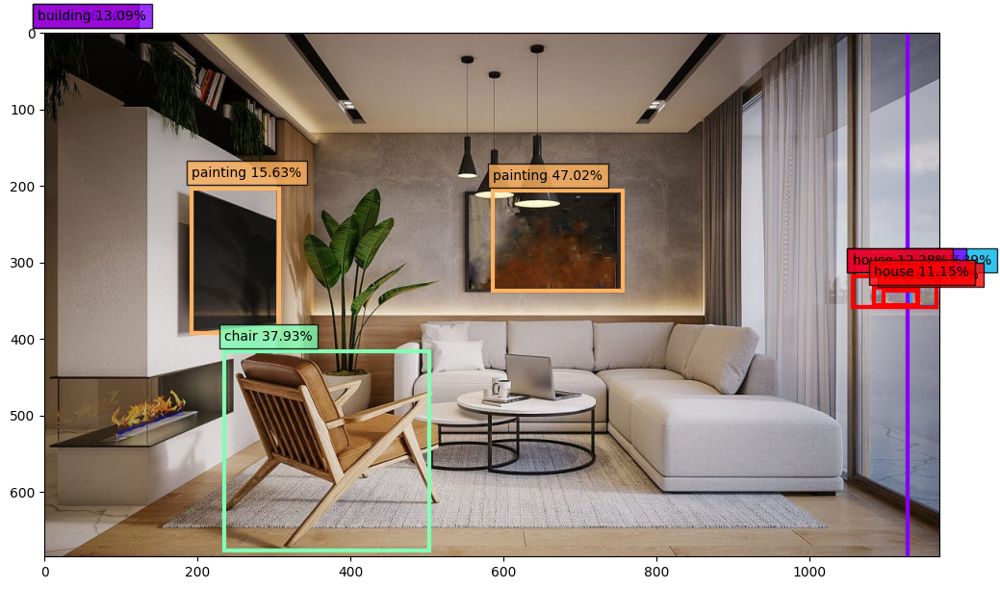

Counter()


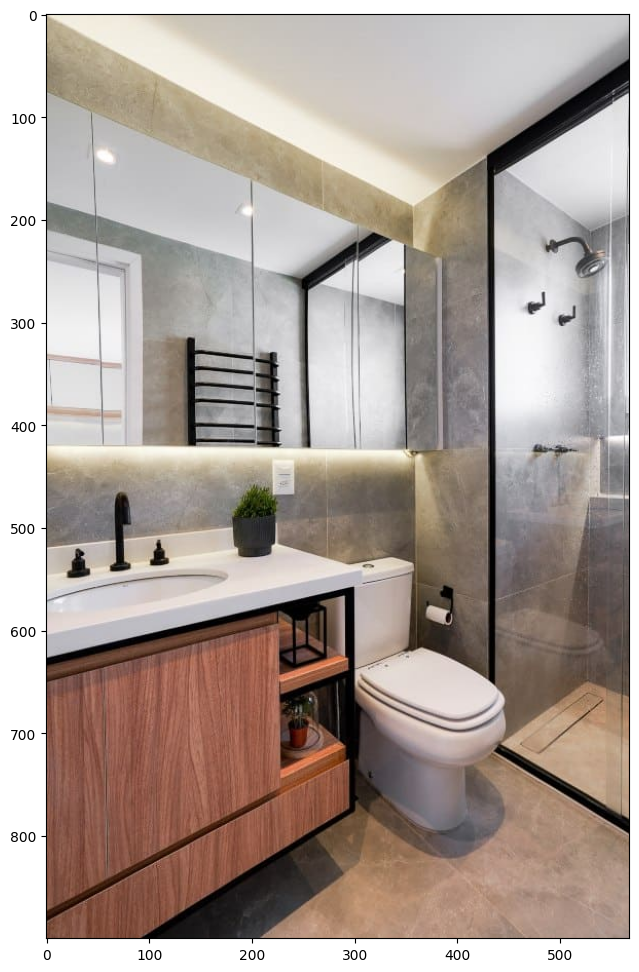

Counter({'pedestrian': 31, 'building': 13, 'house': 1, 'tree': 1})


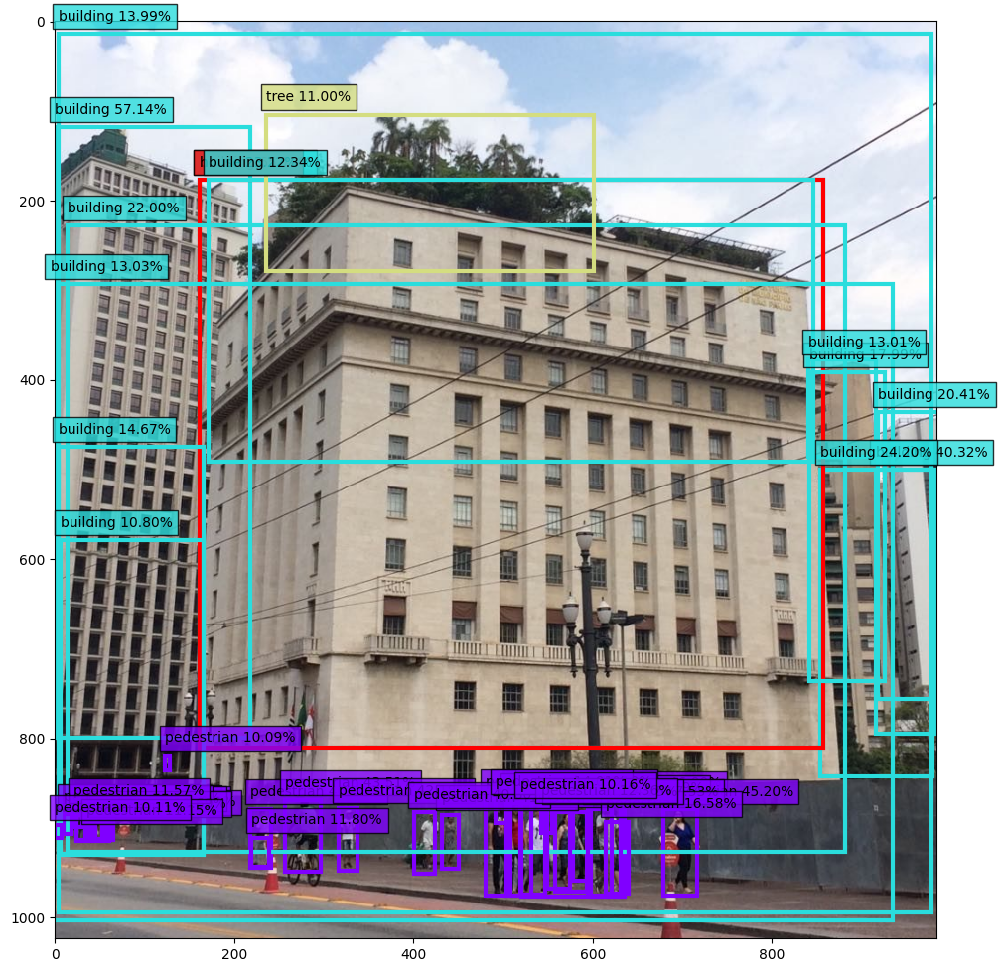

Counter({'pedestrian': 37, 'building': 8})


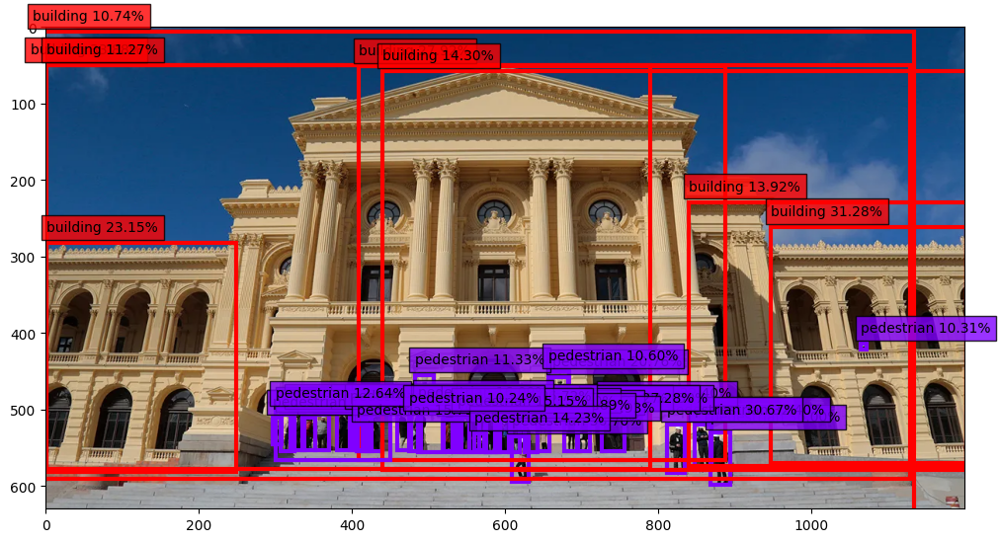

Counter({'building': 22, 'tree': 10, 'pedestrian': 8})


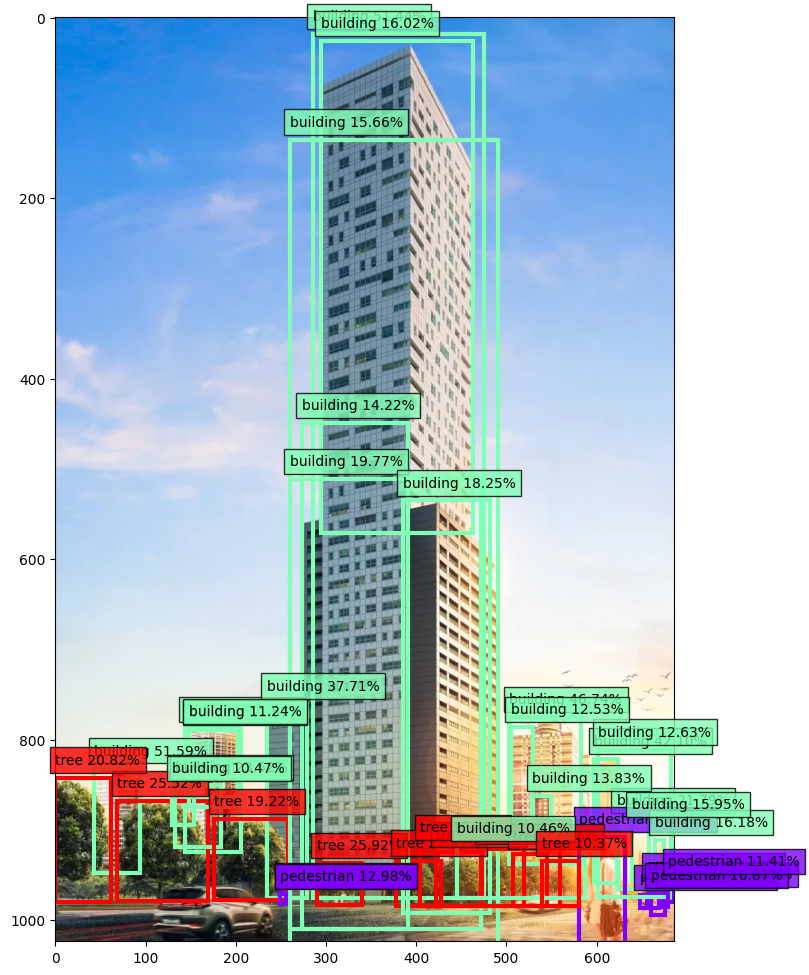

Counter({'chair': 4, 'house': 1})


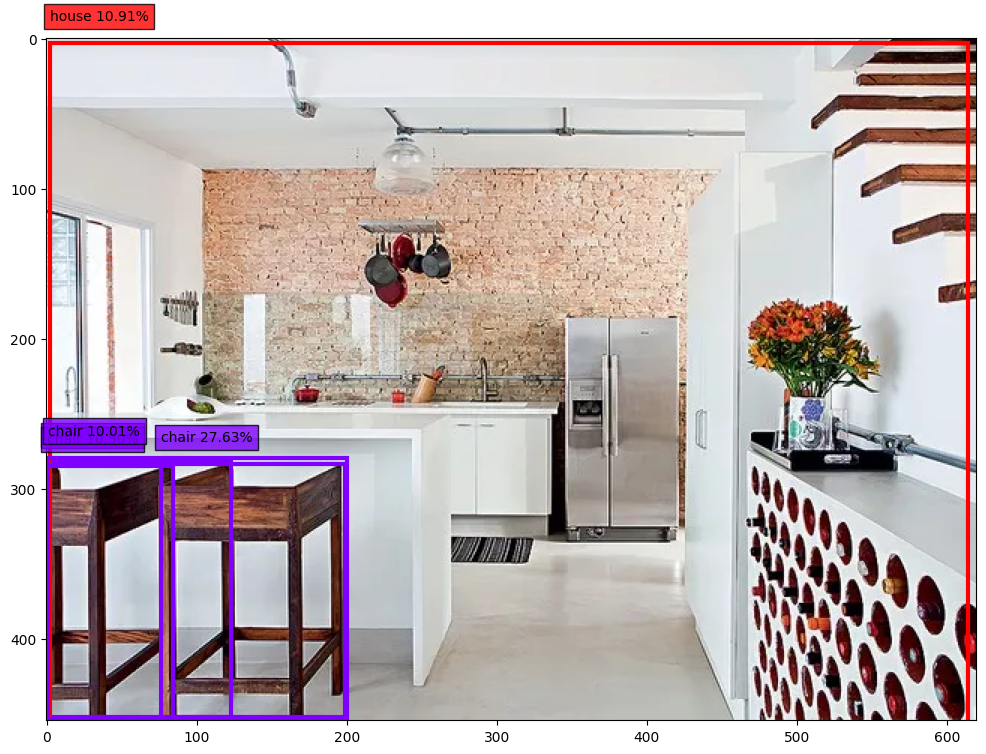

Counter({'house': 3, 'building': 3})


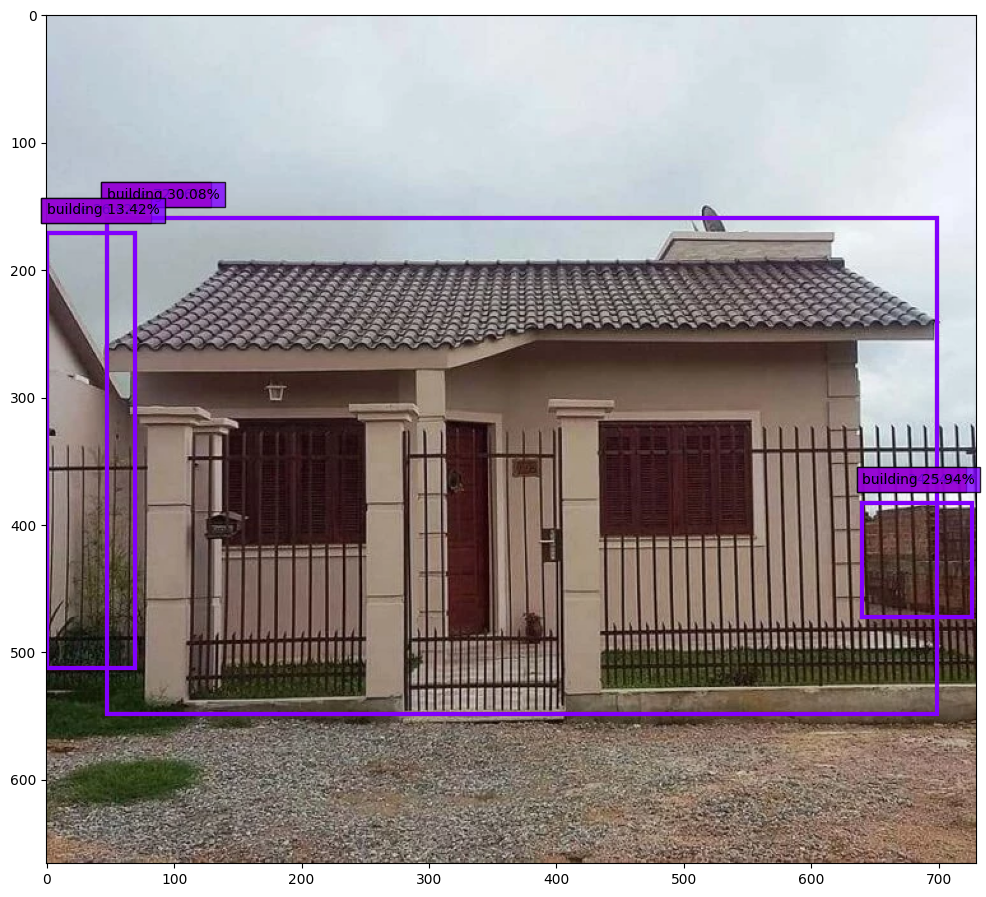

Counter({'painting': 8, 'chair': 2, 'tree': 1})


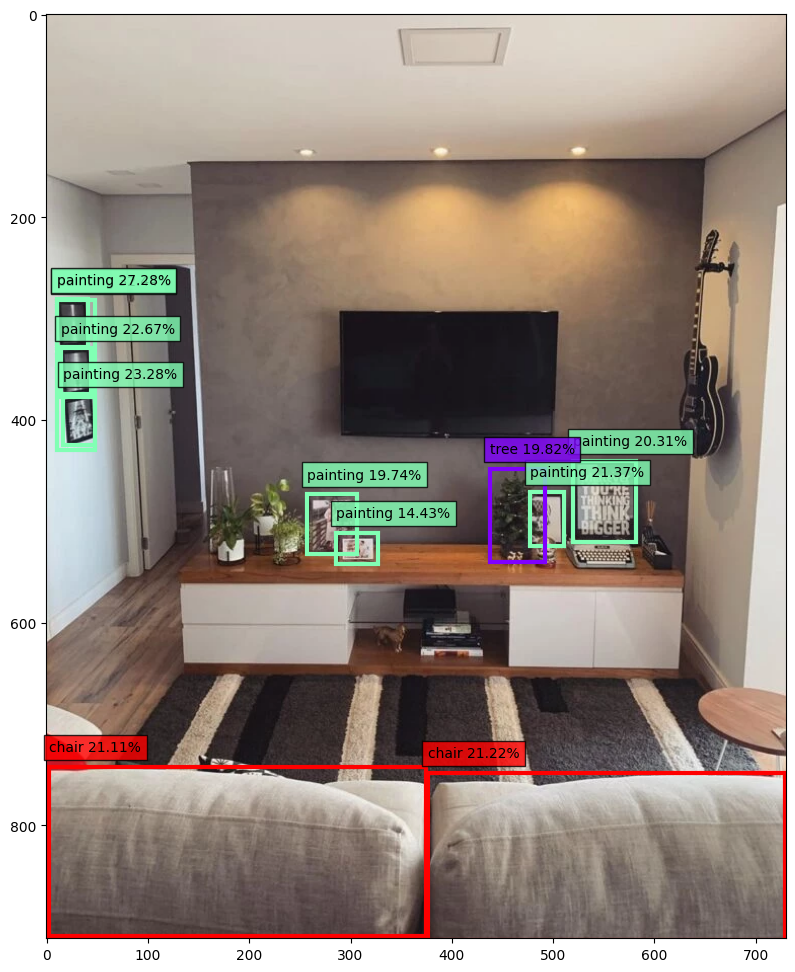

Counter({'tree': 13, 'house': 6, 'chair': 5, 'building': 3, 'painting': 1})


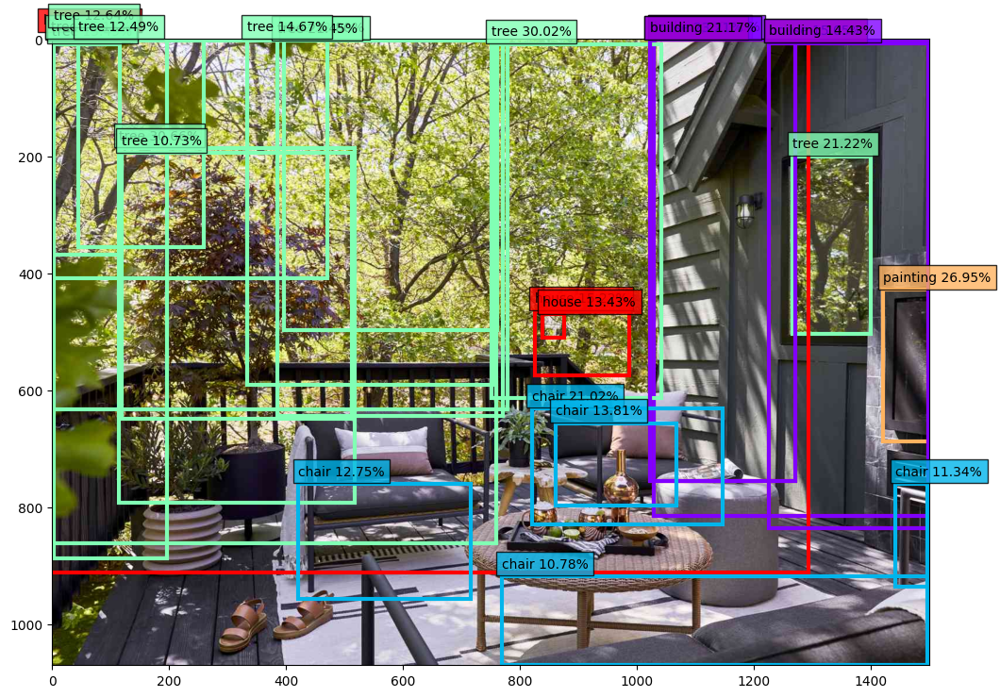

Counter({'house': 1, 'building': 1})


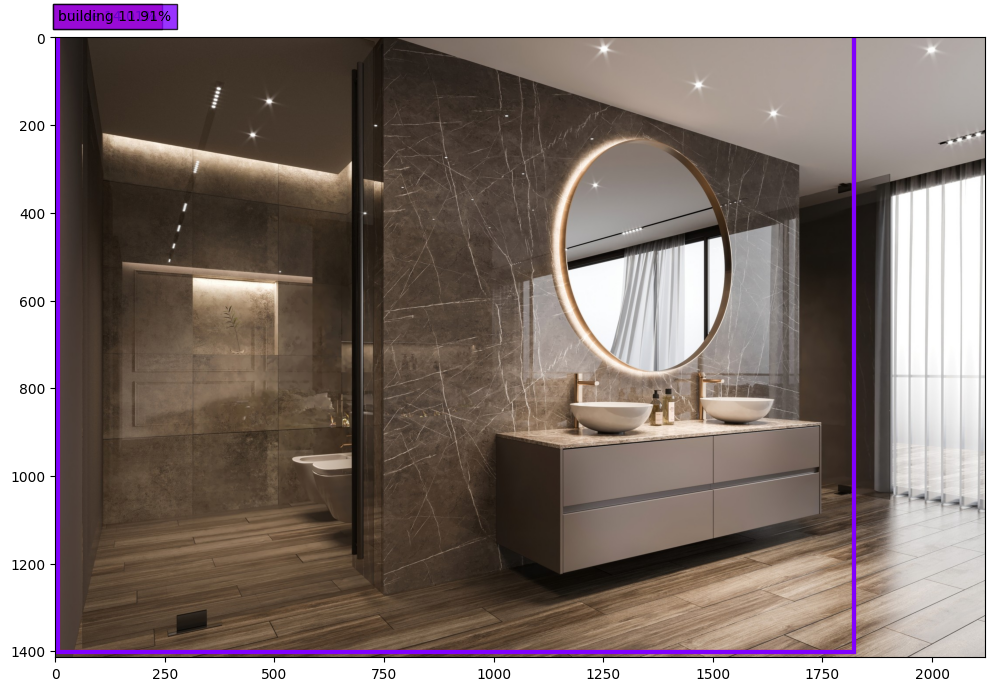

In [29]:
labels = [
    'chair',
    'painting',
    'pedestrian',
    'building',
    'house',
    'tree',
]
threshold = 0.1


imagens = [Image.open(arquivo) for arquivo in Path('imagens/casas').iterdir()]

for imagem in imagens:    
    deteccao = detector(imagem, candidate_labels=labels)
    
    deteccao = [det for det in deteccao if det['score'] >= threshold]
    
    contador = Counter(det['label'] for det in deteccao)
    print(contador)
    
    ajustar_caixas(imagem=imagem, deteccao=deteccao)
    plotar_deteccao(imagem=imagem, deteccao=deteccao, colormap='rainbow')
    plt.show()